<a href="https://colab.research.google.com/github/selyraa/2141720005-pcvk-2023/blob/main/week-10/JS10_Thresholding.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Praktikum 10 - Thresholding

## Import Folder Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Import Library

In [17]:
import cv2 as cv
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image

# PRAKTIKUM

## 1. General Threshold

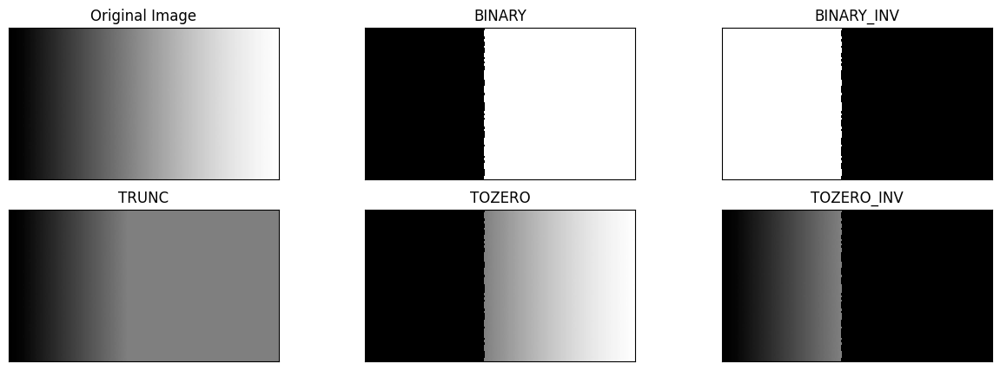

In [4]:
filename = ('/content/drive/MyDrive/PCVK/Images/gradient.jpg')
img = cv.imread(filename)
thresh = 127 #nilai Threshold yang ditentukan
#1. thresh1 jika pixel di img>127, maka thresh1 bernilai 1(putih) selainitu bernilai 0(hitam)
ret,thresh1 = cv.threshold(img,thresh,255,cv.THRESH_BINARY)
#2. thresh2 adalah binary threshold inverse
ret,thresh2 = cv.threshold(img,thresh,255,cv.THRESH_BINARY_INV)
#3. Threshold Truncate
ret,thresh3 = cv.threshold(img,thresh,255,cv.THRESH_TRUNC)
#4. Threshold Tozero
ret,thresh4 = cv.threshold(img,thresh,255,cv.THRESH_TOZERO)
#5. Threshold Tozero Inverse
ret,thresh5 = cv.threshold(img,thresh,255,cv.THRESH_TOZERO_INV)
titles = ['Original Image','BINARY','BINARY_INV','TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
plt.figure(figsize = (15,5))
for i in range(len(images)):
  plt.subplot(2,3,i+1),plt.imshow(images[i],'gray', interpolation='nearest')
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])
plt.show()


## 2. Adaptive Threshold

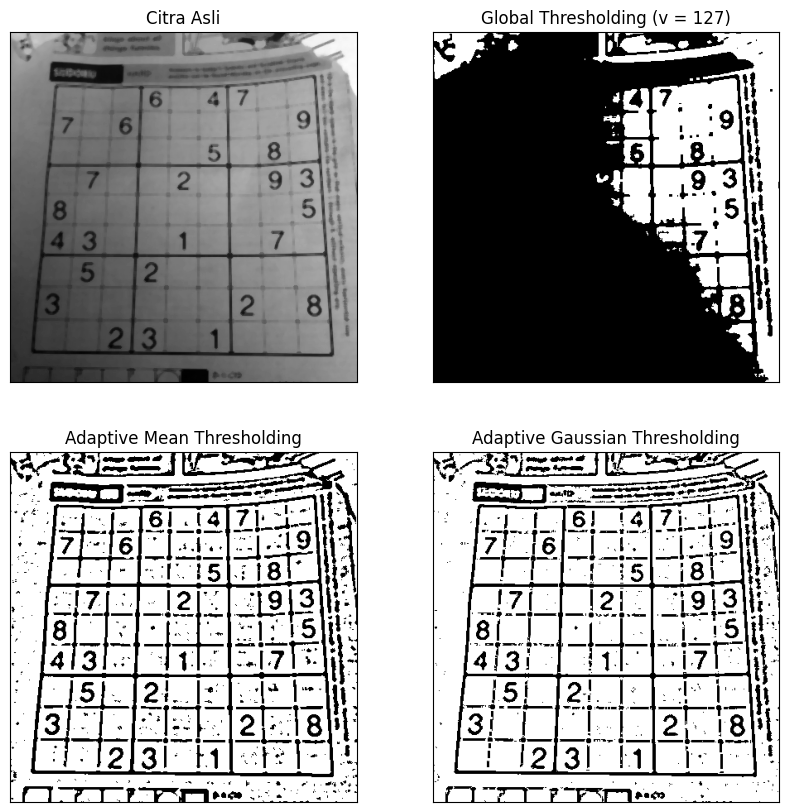

In [5]:
filename = ('/content/drive/MyDrive/PCVK/Images/sudoku-original.jpg')
citra = cv.medianBlur(cv.imread(filename),5)
gray = cv.cvtColor(citra, cv.COLOR_BGR2GRAY)
#gray = cv.medianBlur(gray,5)
thresh = 127
ret,th1 = cv.threshold(gray,thresh,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(gray,255,cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY,11,2)
th3 = cv.adaptiveThreshold(gray,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY,11,2)
titles = ['Citra Asli', 'Global Thresholding (v = 127)', 'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
citra2 = [gray, th1, th2, th3]
plt.figure(figsize = (10,10))
for i in range(len(citra2)):
  plt.subplot(2,2,i+1),plt.imshow(citra2[i],'gray')
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])
plt.show()

## 3. Otsu’s Threshold dengan Library OpenCV

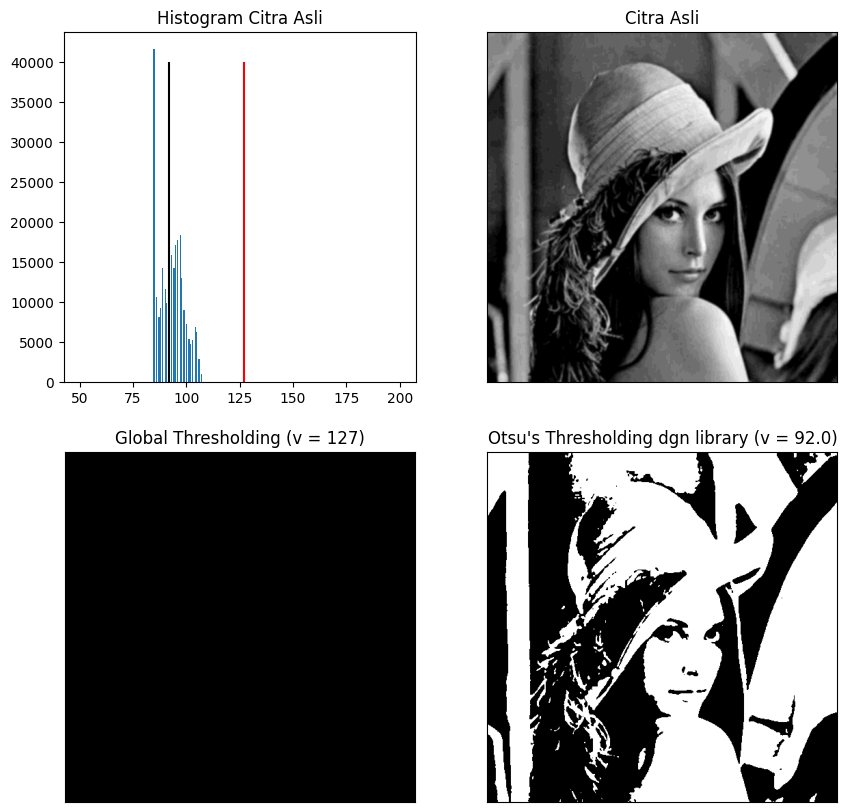

In [10]:
# Dengan Library
filename = ('/content/drive/MyDrive/PCVK/Images/lena_gs_lc2.jpg')
img = cv.imread(filename,0)
blur = cv.GaussianBlur(img,(5,5),0)
thresh = 127
ret,th1 = cv.threshold(blur,thresh,255,cv.THRESH_BINARY)
ret2,th2 = cv.threshold(blur,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
x = ("Otsu's Thresholding dgn library (v = ")+str(ret2)+")"
titles = ['Citra Asli', 'Global Thresholding (v = 127)', x]
citra3 = [blur, th1, th2]
plt.figure(figsize = (10,10))
plt.subplot(2,2,1),plt.hist(blur.ravel(),256,[50,200])
plt.vlines(ret,0,40000,colors='red') #garis vertikal merah menunjukan threshold global 127
plt.vlines(ret2,0,40000,colors='black') #garis vertikal hitam menunjukkan threshold 92 hasil otsu's
plt.title('Histogram Citra Asli')
for i in range(len(citra3)):
  plt.subplot(2,2,i+2),plt.imshow(citra3[i],'gray')
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])
plt.show()


## 4. Otsu's Threshold tanpa Gaussian Filter dan dengan menggunakan Gaussian Filter.


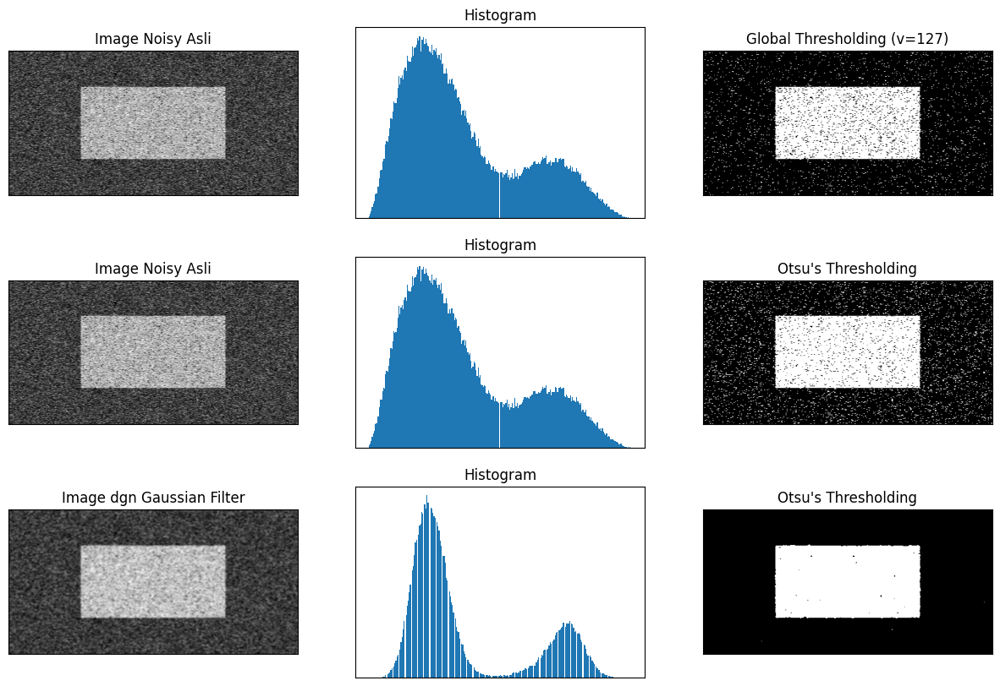

In [11]:
filename = ('/content/drive/MyDrive/PCVK/Images/noisy2.png')
img = cv.imread(filename,0)
#Global Thresholding
ret1,th1 = cv.threshold(img,127,255,cv.THRESH_BINARY)
# Otsu's thresholding
ret2,th2 = cv.threshold(img,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
# Otsu's thresholding setelah dilakukan Gaussian filtering
blur = cv.GaussianBlur(img,(5,5),0)
ret3,th3 = cv.threshold(blur,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
#plotting semua image
images = [img, 0, th1, img, 0, th2, blur, 0, th3]
titles = ['Image Noisy Asli','Histogram','Global Thresholding (v=127)', 'Image Noisy Asli','Histogram',"Otsu's Thresholding", 'Image dgn Gaussian Filter','Histogram',"Otsu's Thresholding"]
plt.figure(figsize = (15,10))
for i in range(3):
  plt.subplot(3,3,i*3+1),plt.imshow(images[i*3],'gray')
  plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
  plt.subplot(3,3,i*3+2),plt.hist(images[i*3].ravel(),256)
  plt.title(titles[i*3+1]), plt.xticks([]), plt.yticks([])
  plt.subplot(3,3,i*3+3),plt.imshow(images[i*3+2],'gray')
  plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])
plt.show()

## 5. Segmentasi Citra menggunakan K-Means

(<Axes: >, <matplotlib.image.AxesImage at 0x7aaa0ec6b3d0>)

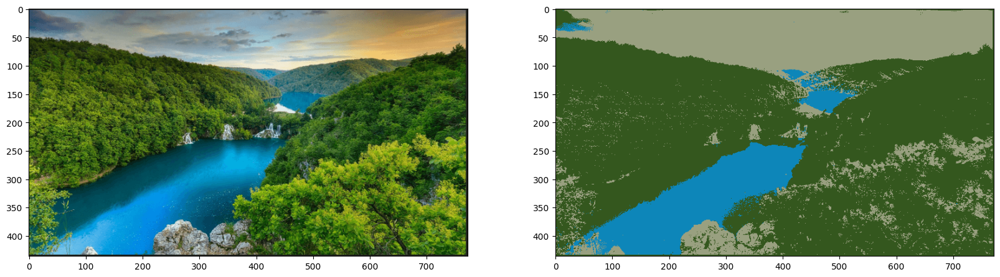

In [14]:
filename = ('/content/drive/MyDrive/PCVK/Images/jungle.png')
img = cv.imread(filename)
img = cv.cvtColor(img,cv.COLOR_BGR2RGB)

'''
kita akan menggunakan fungsi cv.kmeans() yang meminta array 2D sebagai masukan, sedangkan image aslinya adalah array 3D selanjutnya kita perlu melakukan flattening array image masukan
'''
#reshape array ke bentuk 2D
pixel_values = img.reshape((-1, 3))
# convert to float
pixel_values = np.float32(pixel_values)

'''
syarat berhenti iterasi dr KMeans adalah jika centroid sudah tidak terlalu
banyak pergeseran posisi antara interasi sekarang
dengan iterasi sebelumnya (konvergen). Karena jumlah data yang besar, maka
kita akan hentikan iterasi saat jumlah iterasi = 100
atau epsilon(selisih antara posisi centroid skrg dgn posisi centroid di ite
rasi sebelumnya) < 0.2
'''
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 100, 0.2)
'''
jika diperhatikan pada image asli, terdapat 3 warna utama (hijau, biru, dan
 putih/orange). untuk percobaan ini kita akan gunakan
3 cluster untuk image ini
'''
k = 3
_, labels, (centers) = cv.kmeans(pixel_values, k, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)
#konversi titik centroid kedalam integer
centers = np.uint8(centers)
#flattening label array
labels = labels.flatten()
#konversi warna pixel asli kewarna dari tiap centroidnya
segmented_image = centers[labels.flatten()]
# reshape ke bentuk image asli
segmented_image = segmented_image.reshape(img.shape)
plt.figure(figsize = (20,20))
plt.subplot(1,2,1),plt.imshow(img)
plt.subplot(1,2,2),plt.imshow(segmented_image)

## Mengubah Warna pada Cluster

(<Axes: >, <matplotlib.image.AxesImage at 0x7aaa0f21ad10>)

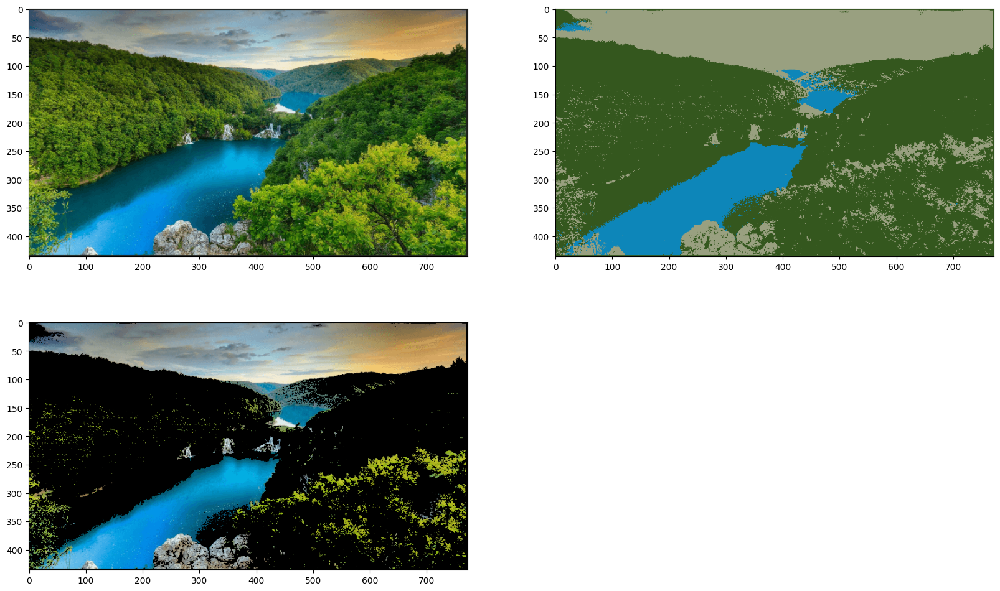

In [15]:
# ubah pixel di cluster 2 menjadi hitam
masked_image = np.copy(img)
# konvert ke bentuk vektor
masked_image = masked_image.reshape((-1, 3))
# cluster yang diubah
cluster = 2
masked_image[labels == cluster] = [0, 0, 0]
# konvert ke bentuk asli
masked_image = masked_image.reshape(img.shape)
plt.figure(figsize = (20,12))
plt.subplot(2,2,1),plt.imshow(img)
plt.subplot(2,2,2),plt.imshow(segmented_image)
plt.subplot(2,2,3),plt.imshow(masked_image)


# TUGAS PRAKTIKUM

## 1.  Global Threshold (BINARY, BINARY_INV, TRUNC, TOZERO, TOZERO_INV), dengan threshold= 170

In [ ]:
filename = ('/content/drive/MyDrive/PCVK/Images/gradient.jpg')

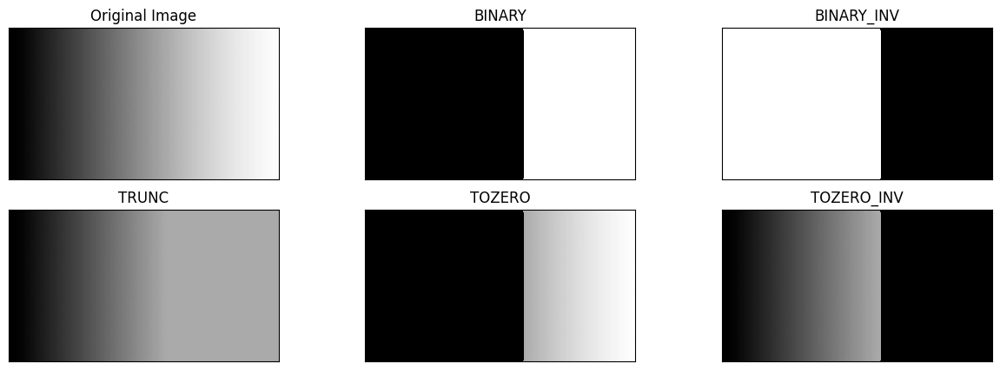

In [ ]:
img = cv.imread(filename)
thresh = 170 #nilai Threshold yang ditentukan
#1. thresh1 jika pixel di img>170, maka thresh1 bernilai 1(putih) selain itu bernilai 0(hitam)
ret,thresh1 = cv.threshold(img,thresh,255,cv.THRESH_BINARY)
#2. thresh2 adalah binary threshold inverse
ret,thresh2 = cv.threshold(img,thresh,255,cv.THRESH_BINARY_INV)
#3. Threshold Truncate
ret,thresh3 = cv.threshold(img,thresh,255,cv.THRESH_TRUNC)
#4. Threshold Tozero
ret,thresh4 = cv.threshold(img,thresh,255,cv.THRESH_TOZERO)
#5. Threshold Tozero Inverse
ret,thresh5 = cv.threshold(img,thresh,255,cv.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

plt.figure(figsize = (15,5))
for i in range(len(images)):
  plt.subplot(2,3,i+1),plt.imshow(images[i],'gray', interpolation='nearest')
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])
plt.show()

## 2. Otsu Thresholding tanpa menggunakan Library

In [18]:
img = cv2.imread('/content/drive/MyDrive/PCVK/KTP/ktp.png', 0)

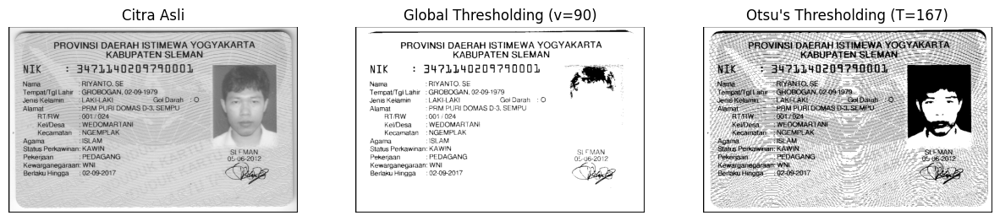

In [21]:
# Hitung histogram citra
hist = np.histogram(img, bins=256, range=(0, 256))[0]

# Global threshold dengan v = 90
threshold_value = 90
global_thresholded = (img > threshold_value).astype(np.uint8) * 255
img = img.astype(np.uint8)

# Hitung histogram citra
hist = np.histogram(img, bins=256, range=(0, 256))[0]

# Hitung jumlah total pixel
total_pixel = img.shape[0] * img.shape[1]

# Menghitung probabilitas masing-masing level intensitas
prob = hist / total_pixel

# Inisialisasi variabel untuk Otsu's threshold
best_threshold = 0
best_variance = 0

# Menghitung rata-rata total
total_mean = np.sum(np.arange(256) * prob)

# Loop untuk mencari nilai ambang batas Otsu yang optimal
for threshold in range(256):
    # Probabilitas kelas atas
    prob_1 = np.sum(prob[:threshold])

    # Probabilitas kelas bawah
    prob_2 = 1 - prob_1

    # Rata-rata kelas atas
    mean_1 = np.sum(np.arange(threshold) * prob[:threshold]) / prob_1 if prob_1 > 0 else 0

    # Rata-rata kelas bawah
    mean_2 = (total_mean - (mean_1 * prob_1)) / prob_2 if prob_2 > 0 else 0

    # Varians antara kelas
    between_class_variance = prob_1 * prob_2 * (mean_1 - mean_2) ** 2

    if between_class_variance > best_variance:
        best_variance = between_class_variance
        best_threshold = threshold

# Terapkan Otsu's threshold
otsu_thresholded = (img > best_threshold).astype(np.uint8) * 255

plt.figure(figsize=(15,5))

# Tampilkan citra asli
plt.subplot(131)
img_with_border = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
cv2.rectangle(img_with_border, (0, 0), (img.shape[1], img.shape[0]), (0, 0, 0), 5)
plt.imshow(img_with_border)
plt.title('Citra Asli')
plt.axis("off")

# Tampilkan citra dengan global threshold
plt.subplot(132)
global_thresholded_with_border = cv2.cvtColor(global_thresholded, cv2.COLOR_GRAY2BGR)
cv2.rectangle(global_thresholded_with_border, (0, 0), (img.shape[1], img.shape[0]), (0, 0, 0), 5)
plt.imshow(global_thresholded_with_border)
plt.title('Global Thresholding (v=90)')
plt.axis("off")

# Tampilkan citra dengan Otsu's threshold
plt.subplot(133)
otsu_thresholded_with_border = cv2.cvtColor(otsu_thresholded, cv2.COLOR_GRAY2BGR)
cv2.rectangle(otsu_thresholded_with_border, (0, 0), (img.shape[1], img.shape[0]), (0, 0, 0), 5)
plt.imshow(otsu_thresholded_with_border)
plt.title(f"Otsu's Thresholding (T={best_threshold})")
plt.axis("off")

plt.show()

## 3. Buat histogram dari citra tersegmentasi, Histogram hanya pada foreground image saja. Gunakan image ktp Riyanto.jpg

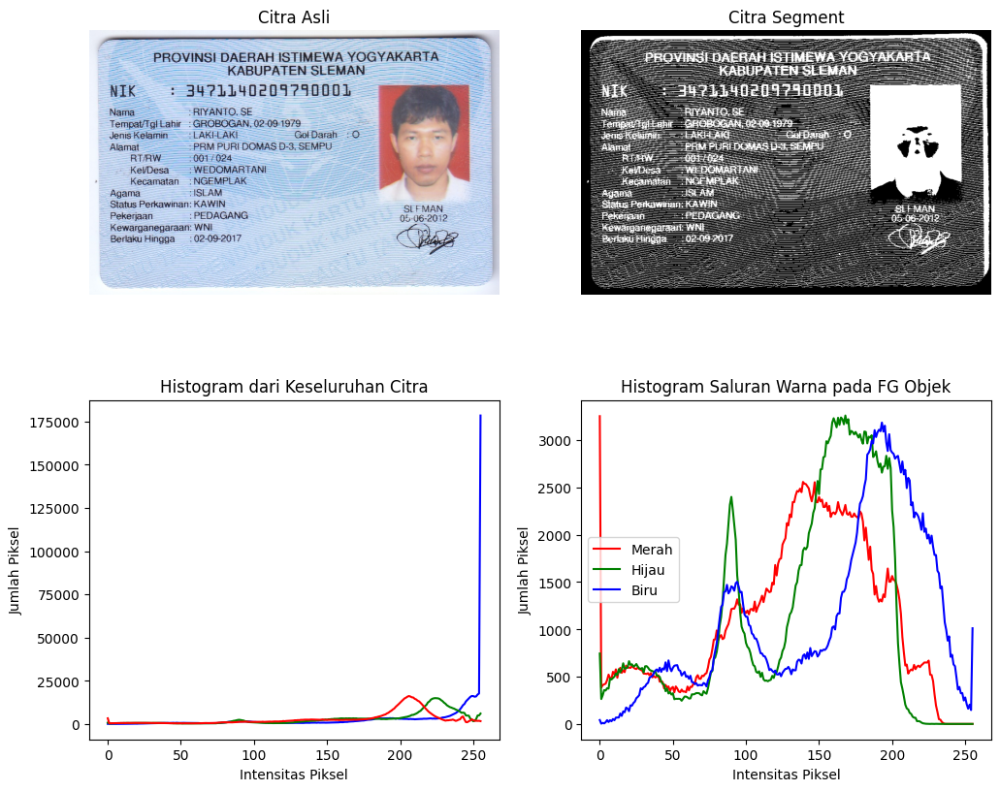

In [ ]:
# Membaca gambar
img = cv2.imread('/content/drive/MyDrive/PCVK/KTP/ktp.png')

# Terapkan threshold
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

ret, thresholded = cv2.threshold(gray_img, 200, 255, cv2.THRESH_BINARY)
foreground = cv2.bitwise_not(thresholded)

# Buat mask untuk citra tersegmentasi (foreground)
mask = thresholded > 0

# Memisahkan saluran warna
b, g, r = cv2.split(img)

# Hitung histogram pada citra keseluruhan
hist_full_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_full_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_full_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Hitung histogram pada citra tersegmentasi (foreground) untuk masing-masing saluran warna
hist_red = cv2.calcHist([r], [0], foreground, [256], [0, 256])
hist_green = cv2.calcHist([g], [0], foreground, [256], [0, 256])
hist_blue = cv2.calcHist([b], [0], foreground, [256], [0, 256])

# Tampilkan citra asli
plt.figure(figsize=(12, 10))
plt.subplot(221)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Citra Asli')
plt.axis("off")

# Tampilkan citra tersegmentasi (foreground)
plt.subplot(222)
plt.imshow(foreground, cmap='gray')
plt.title('Citra Segment')
plt.axis("off")

# Tampilkan histogram pada citra keseluruhan
plt.subplot(223)
plt.plot(hist_full_b, color='blue', label='Merah')
plt.plot(hist_full_g, color='green', label='Hijau')
plt.plot(hist_full_r, color='red', label='Biru')
plt.title('Histogram dari Keseluruhan Citra')
plt.xlabel('Intensitas Piksel')
plt.ylabel('Jumlah Piksel')

# Tampilkan histogram pada citra tersegmentasi (foreground) untuk masing-masing saluran warna
plt.subplot(224)
plt.plot(hist_red, color='red', label='Merah')
plt.plot(hist_green, color='green', label='Hijau')
plt.plot(hist_blue, color='blue', label='Biru')
plt.title('Histogram Saluran Warna pada FG Objek')
plt.xlabel('Intensitas Piksel')
plt.ylabel('Jumlah Piksel')
plt.legend()

plt.show()

## 4. Lakukan segmentasi warna pada image " ktp Riyanto.jpg ", munculkan hanya warna yang biru saja. (Petunjuk: anda dapat gunakan K-Means untuk menampilkan hanya warna tertentu saja)

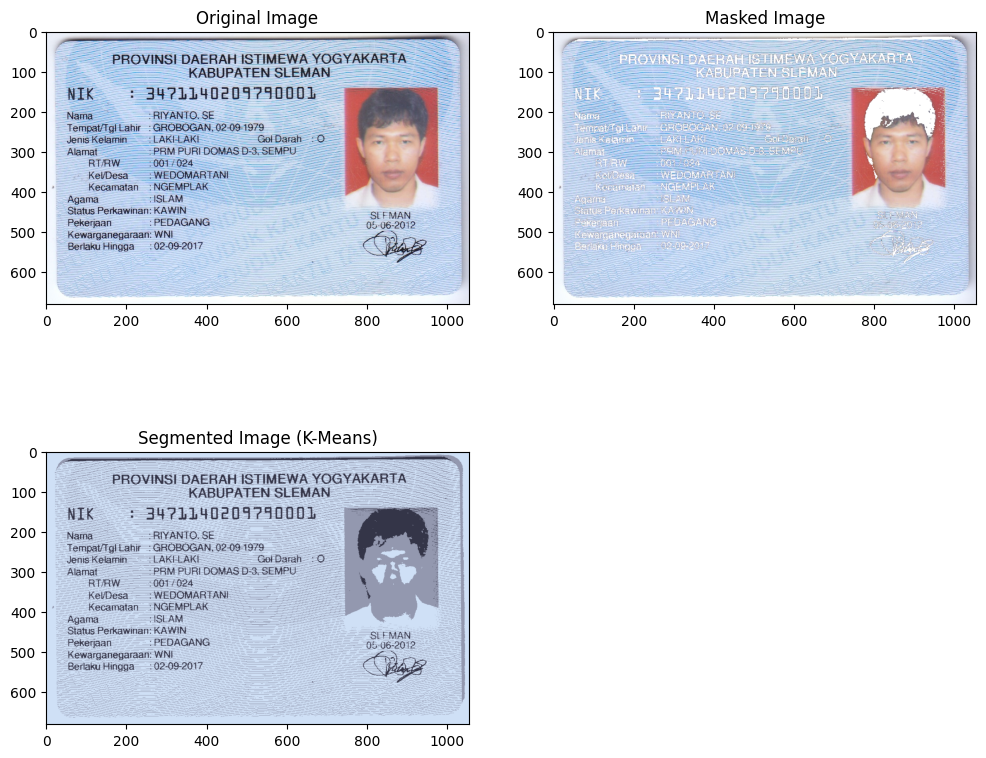

In [ ]:
from sklearn.cluster import KMeans

# Load the image
img = cv2.imread('/content/drive/MyDrive/PCVK/KTP/ktp.png')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Meratakan nilai piksel
pixel_values = img_rgb.reshape((-1, 3))
pixel_values = np.float32(pixel_values)

# # Mendefinisikan kriteria dan jumlah clusters (k)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
k = 3

# Implementasi K-Means clustering
_, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Mengonversi centers ke integer
centers = np.uint8(centers)

# Meratakan array label
labels = labels.flatten()

# Membuat masked image dengan mengubah satu cluster menjadi putih
masked_image = np.copy(img_rgb)
masked_image = masked_image.reshape((-1, 3))
cluster_to_white = 2
masked_image[labels == cluster_to_white] = [255, 255, 255]
masked_image = masked_image.reshape(img_rgb.shape)

# Mengonversi gambar tersegmentasi kembali ke bentuk asli
segmented_image = centers[labels].reshape(img_rgb.shape)

# Menampilkan original image, segmented image, dan masked image
plt.figure(figsize=(12, 10))
plt.subplot(2, 2, 1), plt.imshow(img_rgb)
plt.title('Original Image')

plt.subplot(2, 2, 2), plt.imshow(masked_image)
plt.title('Masked Image')

plt.subplot(2, 2, 3), plt.imshow(segmented_image)
plt.title('Segmented Image (K-Means)')

plt.show()

# Tugas
Mengimplementasikan thresholding dengan beberapa metode untuk melakukan segmentasi pada dataset KTP

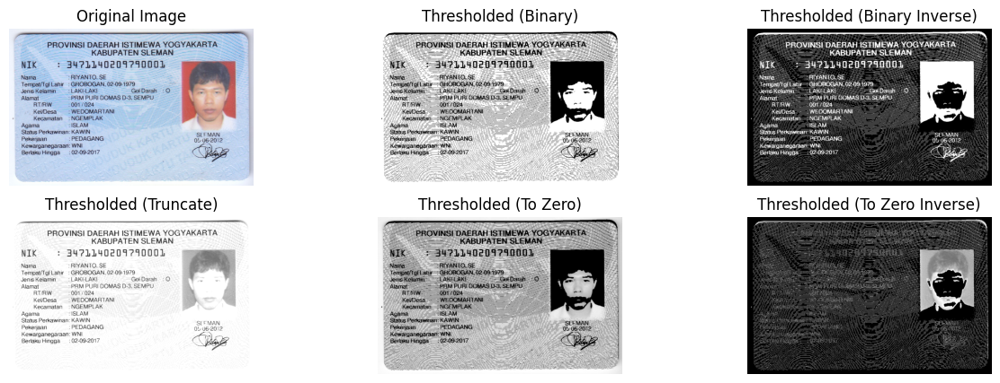

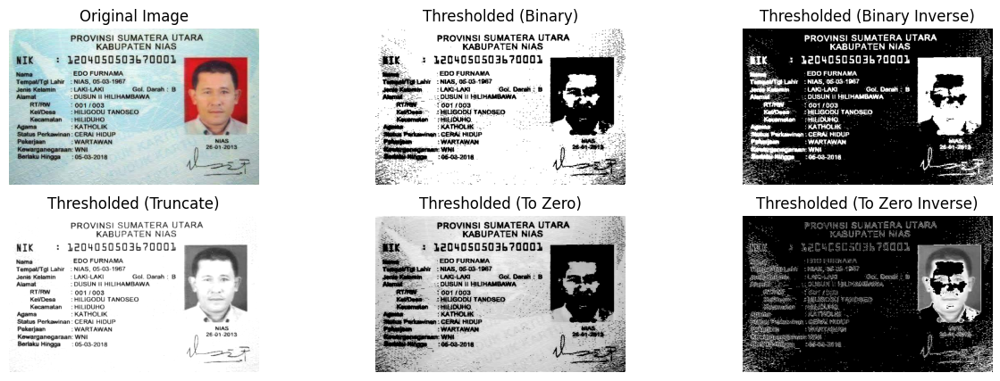

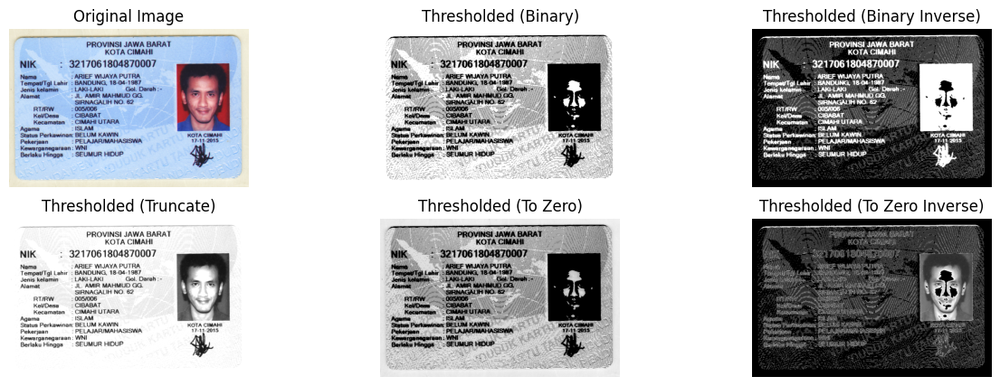

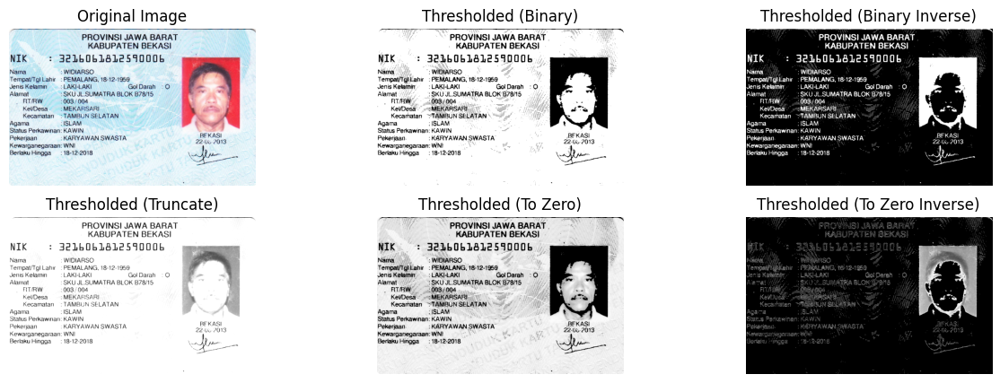

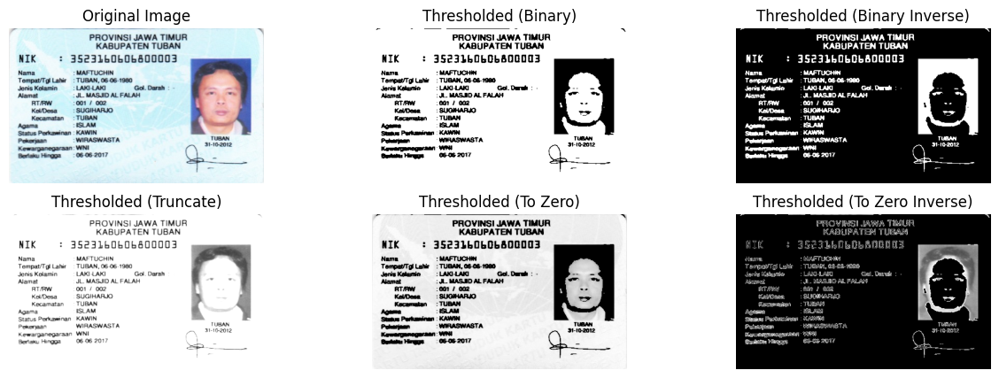

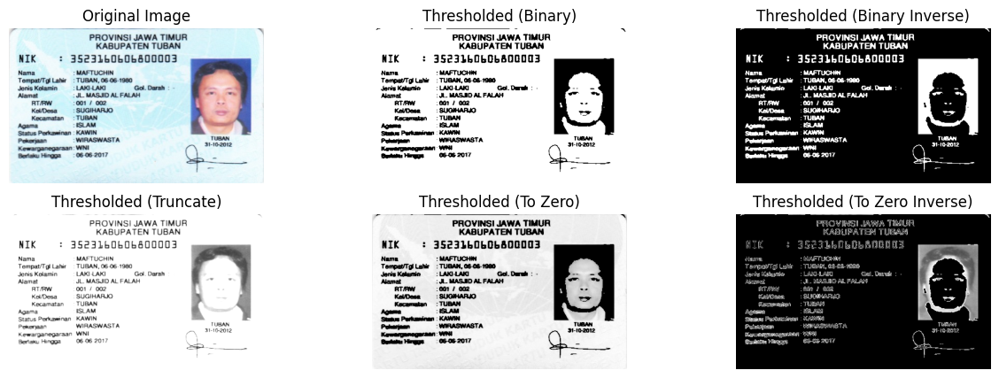

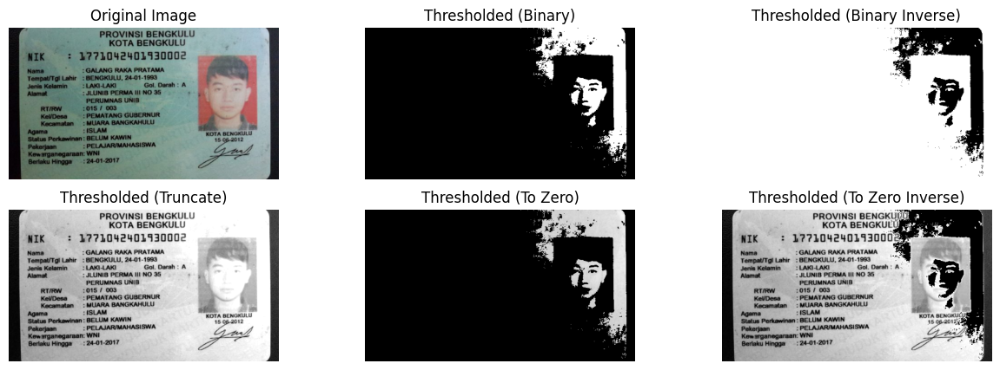

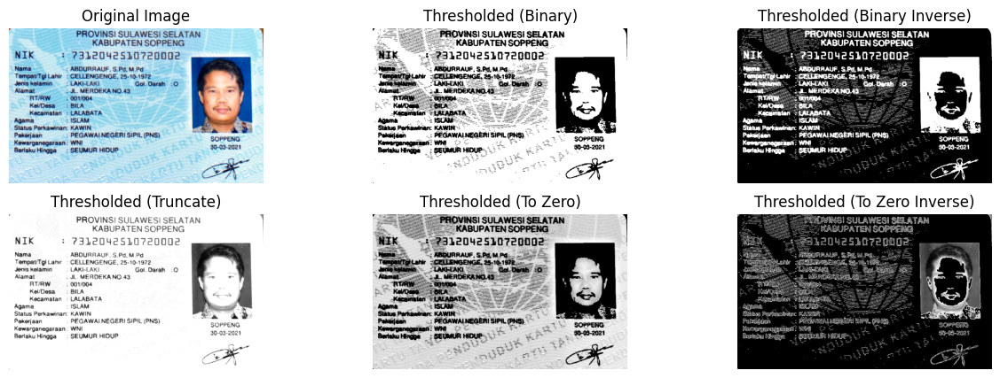

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Path to the folder containing KTP images
folder_path = '/content/drive/MyDrive/PCVK/KTP/'

# Get a list of image files in the folder
ktp_files = [file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Define the threshold value
threshold_value = 170  # You can adjust this threshold value

# Define a list of thresholding methods
threshold_methods = ['Binary', 'Binary Inverse', 'Truncate', 'To Zero', 'To Zero Inverse']

# Iterate through KTP images
for i, ktp_file in enumerate(ktp_files):
    ktp_path = os.path.join(folder_path, ktp_file)
    ktp_image = cv2.imread(ktp_path)

    # Create a subplot for each thresholding method
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(2, 3, 1)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(ktp_image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(ktp_image, cv2.COLOR_BGR2GRAY)

    # Apply different thresholding methods
    for j, method in enumerate(threshold_methods):
        # Apply thresholding
        if method == 'Binary':
            _, thresholded_image = cv2.threshold(gray_image, threshold_value, 255, cv2.THRESH_BINARY)
        elif method == 'Binary Inverse':
            _, thresholded_image = cv2.threshold(gray_image, threshold_value, 255, cv2.THRESH_BINARY_INV)
        elif method == 'Truncate':
            _, thresholded_image = cv2.threshold(gray_image, threshold_value, 255, cv2.THRESH_TRUNC)
        elif method == 'To Zero':
            _, thresholded_image = cv2.threshold(gray_image, threshold_value, 255, cv2.THRESH_TOZERO)
        elif method == 'To Zero Inverse':
            _, thresholded_image = cv2.threshold(gray_image, threshold_value, 255, cv2.THRESH_TOZERO_INV)

        # Create a subplot for the thresholded image
        plt.subplot(2, 3, j + 2)
        plt.axis('off')
        plt.imshow(thresholded_image, cmap='gray')
        plt.title(f'Thresholded ({method})')

    plt.show()


## Mencoba untuk Melakukan Segmentasi menggunakan K-Means, kemudian mengekstrak gambar menjadi teks dengan pytesseract

In [ ]:
!pip install pytesseract
!sudo apt-get install tesseract-ocr-ind

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-ind tesseract-ocr-osd
0 upgraded, 4 newly installed, 0 to remove and 19 not upgraded.
Need to get 5,353 kB of archives.
After this operation, 16.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-ind all 1:4.00~git30-7274cfa-1.1 [537 kB]
Fetched 5,353 kB in 2s (3,133 kB/s)
debconf: unable to ini

## Segmentasi K-Means - Ektraksi Teks dengan pytesseract


Teks terambil dari gambar ktp.png:
 



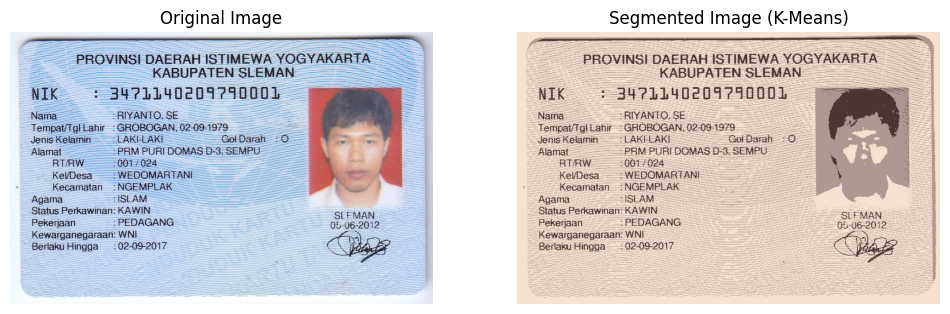


Teks terambil dari gambar ktp5.png:
PROVINSI SUMATERA UTARA
KABUPATEN NIAS

 

NIK: 1201050503670001
Noma EDO FURNAMA
TempatiTgi Lahir : NIAS, 05-03-1967
Jenis Kelamin —: LAKI-LAKI Gol. Darah : B
Alamat 1DUSUN II HILIHAMBAWA
RTRW 1001/7003
KevDesa — -HILIGODU TANOSEO
Kecamatan : HILIDUHO
Agama 1 KATHOLIK
Status Perkawinan: CERAI HIDUP
Peketjaan : WARTAWAN NIAS
Kewarganegaraan: WNI AANG
Berlaku Hingga — :05-03-2018 4 2
— LA

Ta



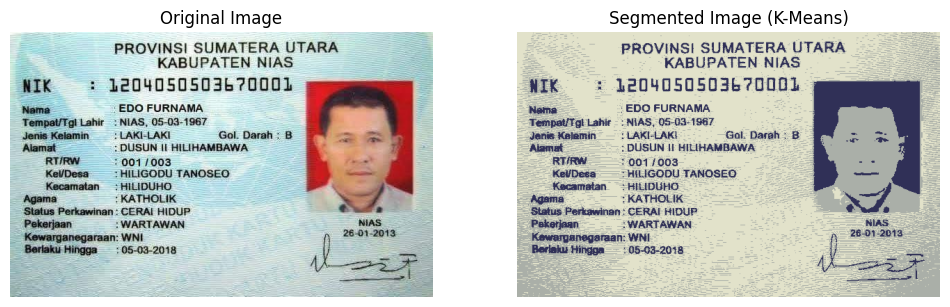


Teks terambil dari gambar ktp2.png:
LE

PROVINSI JAWA BARAT

KOTA-CIMAHI
NIK : 3217061804870007
Nama :ARIEF WIJAYA PUTRA
Tempat/Tgi Lahir : BANDUNG, 18-04-1987
Jenis kelamin #EAKI-AKI Gol-Darah-—-
Alamat 1 JL- AMIR MAHMUD GG.
SIRNAGALIH NO.-62

RTRW 20051006
Kel/Desa :CIBABAT
Kecamatan : CIMAHI UTARA

   

Agama #ISLAM Br
Status Perkawinan: BELUM KAWIN KOTA CIMAHI
Pekerjaan 1 PELAJAR/MAHASISWA 4-1 -2015

Kewarganegaraan: WNI
Berlaku Hingga : SEUMUR HIDUP



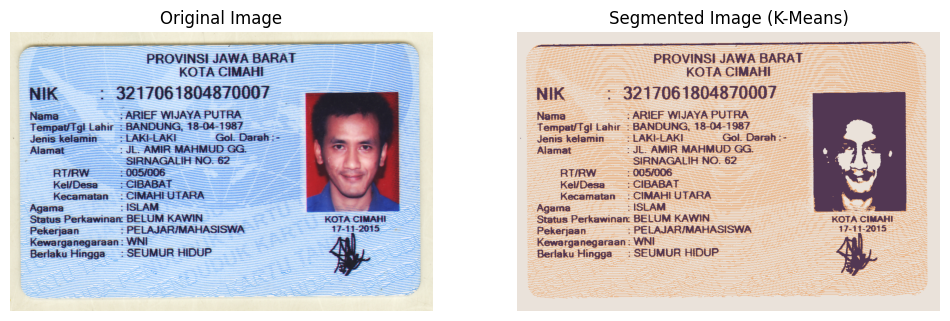


Teks terambil dari gambar ktp6.png:
 

     

— PROVINSI JAWA BAR
KABUPATEN BEKASI

381b0b181259000b

   

i : PEMALANG, 18-12-1959
Jenis Kelamin » LAKI-LAKI Gol Darah
: : SKU JLSUMATRA BLOK 878/15

   

Kecamatan -

Agama -ISLAM
Status Perkawinan: KAWIN
Pekerjaan. : KARYAWAN SWASTA

Kewarganegaraan: WNI B3 —-
Berlaku Hingga: 18-12-2018 8

  

 

 

   

BEKASI
25-65 2018

 



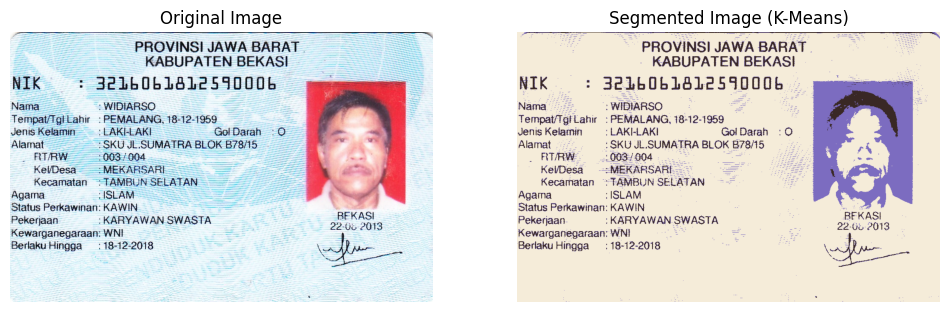


Teks terambil dari gambar ktp3.png:
PROVINSI JAWA TIMUR
KABUPATEN TUBAN

NIK 3523160-04800003
Nama : MAFTUCHIN
Tempat/Tgl Lahir : TUBAN, 08-06-1980
Jenis Kelamin LAKI-LAKI Gol. Darah :
Namat :JL MASJID AL FALAH

RTRW :001/ 002

KelDesa —: SUGIHARIO

Kecamatan : TUBAN
Agama: HISLAM
“Status Perkaminan KAWIN

 



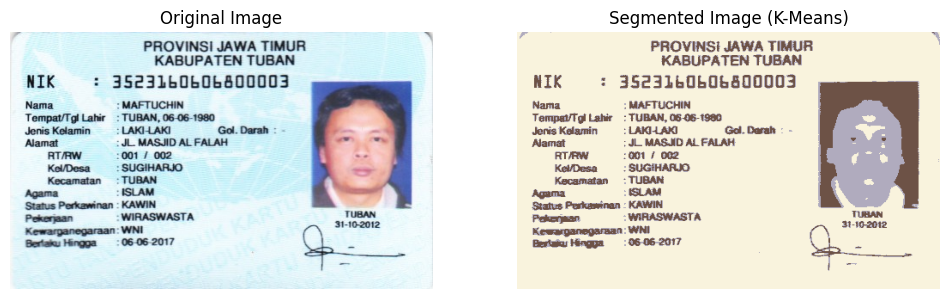


Teks terambil dari gambar ktp4.png:
PROVINSI JAWA TIMUR
KABUPATEN TUBAN

NIK 3523160-04800003
Nama : MAFTUCHIN
Tempat/Tgi Lahir TUBAN, 08-06-1980
Jenis Kelamin LAKI-LAKI Gol. Darah :
Namat :JL MASJID AL FALAH

RTRW :001/ 002

KevDesa —: SUGIHARJO

Kecamatan : TUBAN
Agama: HISLAM
“Status Perkaminan KAWIN

 



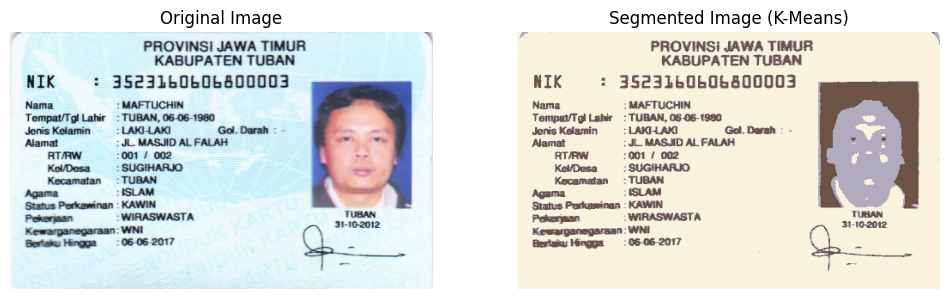


Teks terambil dari gambar ktp1.png:
PROVINSI BENGKULU
KOTA BENGKULU

KIK 3 1971012101930002
Hama : GALANG RAKA PRATAMA
TempatTgi Lahir : BENGKULU, 24-01-1993
Jenis Kelamin #LAKI-LAKI Gol. Darah : A
Alamat 2 JLUNIB PERMA IL NO 35
PERUMNAS UNIB

RTRW 1015 Ff 003

KelDesa : PEMATANG GUBERNUR

Kecamatan —: MUARA BANGKAHULU n
Sa Perkawinan : petum KAWIN Kor senotu

PELAJAR/MAHASISWA 15912

Pekarjaan 5
Kewarganegaraan: WNI
Berlaku Hingga — :24-01-2017

JP

ta



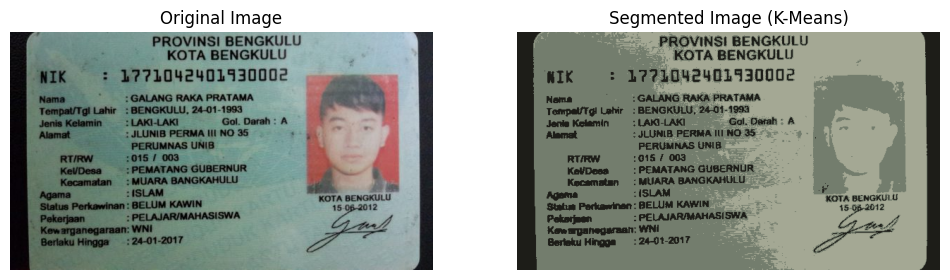


Teks terambil dari gambar KTP7.jpeg:
PROVINSI SULAWESI SELATAN

KABUPATEN SOPPENG
NIK 17312042510 700002
Nama : ABDURRAUF, S.Pd, M.Pd
Tampat/Tgi Lahir “CELLENGENGE, 25-10-1972
Jenis kelamin — - LAKI-LAKI Got. Derah 0
Alamat 1it: MERDEKA NO.43
RTIAW gown

Kel/Desa BIPA
Kecamatan : LALABATA

   

Agama 2 ISLAM 3 3
Status Perkawinan: KAWIN Aa AD
Pekerjaan : PEGAWAI NEGERI SIPIL (PNS) SOPPENG
Kewarganegaraan: WNI Sa gagoi

Berlaku Hingga: SEUMUR HIDUP



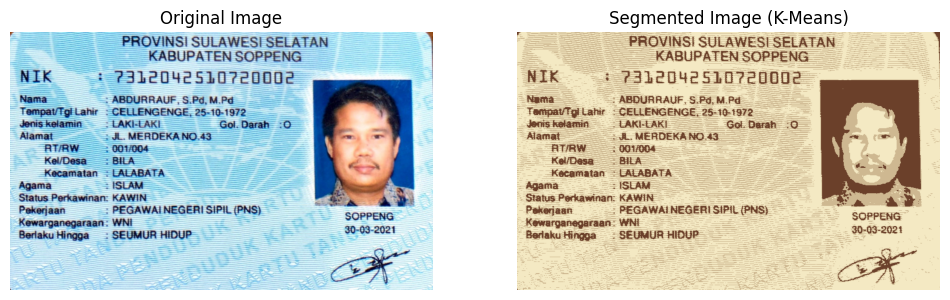

In [ ]:
from sklearn.cluster import KMeans

# Path to the folder containing KTP images
folder_path = '/content/drive/MyDrive/PCVK/KTP/'

# Get a list of image files in the folder
ktp_files = [file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Define the number of clusters (colors)
num_clusters = 3

# Iterate through KTP images
for i, ktp_file in enumerate(ktp_files):
    ktp_path = os.path.join(folder_path, ktp_file)
    ktp_image = cv2.imread(ktp_path)

    # Flatten the pixel values
    pixel_values = ktp_image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)

    # Define the criteria for K-Means
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

    # Apply K-Means clustering
    _, labels, centers = cv2.kmeans(pixel_values, num_clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    # Convert the centers to integers
    centers = np.uint8(centers)

    # Create a segmented image using the cluster centers
    segmented_image = centers[labels.flatten()].reshape(ktp_image.shape)

    # Display the original image and segmented image
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(ktp_image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    plt.axis('off')
    plt.imshow(segmented_image)
    plt.title(f'Segmented Image (K-Means)')

    # Lakukan OCR untuk mendapatkan teks dari citra biner
    text = pytesseract.image_to_string(segmented_image, lang="ind")
    print(f'\nTeks terambil dari gambar {ktp_file}:\n{text}')

    plt.show()


## Thresholding - Segmentasi K-Means - Konversi Biner - Ektraksi Teks dengan pytesseract


Teks terambil dari gambar ktp.png:
      

5 Status | At h 3 5 #SEFMAN
5 Pekerjaan . 8 05-06-2012.



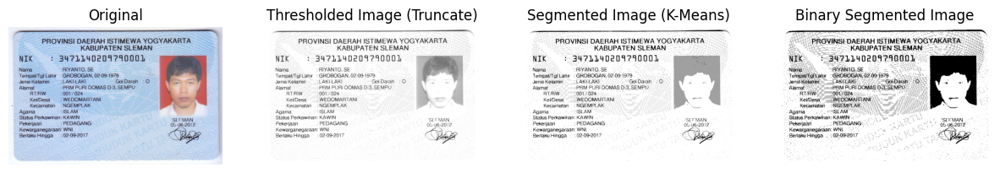


Teks terambil dari gambar ktp5.png:
PROVINSI SUMATERA UTARA
KABUPATEN NIAS

NIK 1 12040505036 70001

Hama EDO FURNAMA
Tempet/Tgl Lahir : NIAS, 05-03-1967

 

 

Jenis Kelamin KI-LAKI Gol. Darah : B
Alamat USUN II HILIHAMBAWA
RTIRW : 0011003
KevDesa — : HILIGODU TANOSEO
Kecamatan : HILIDUHO
Agama : KATHOLIK
Status Perkawinan: CERAI HIDUP
Pekerjaan : WARTAWAN

Kewarganegaraan: WNI
Berlaku Hingga 05-03-2018

 



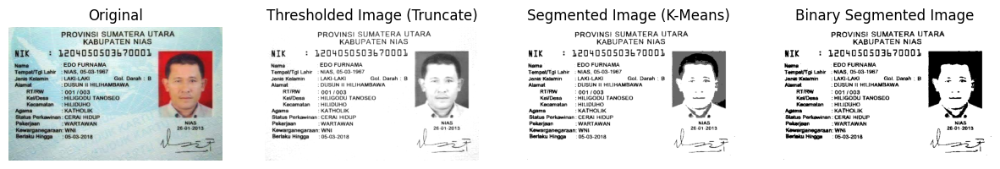


Teks terambil dari gambar ktp2.png:
PROVINSI JAWA BARAT

 

KOTA CIMAHI
NIK :13217061304870007
Nama TARIEF WIJAYA PUTRA
Tempat Tgi Lahir : BANDUNG, 18-04-1987
Jenis kelamin 2 EAKI-L-AKI Soi. Darah :-
Alamat 1 JL AMIR MAHMUD GG.
SIRNAGALIH NO-62

RT/RW 10057006

Kel/Desa -CIBABAT

Kecamatan : CIMAHFUTARA
Agama : ISLAM
Status Perkawinan BELUM KAWIN KOTA CIMAHI
Pekerjaan 1 PELAJAR/MAHASISWA 7-1-2015
Kewarganegaraan: WNI

Berlaku Hingga

: SEUMUR HIDUP



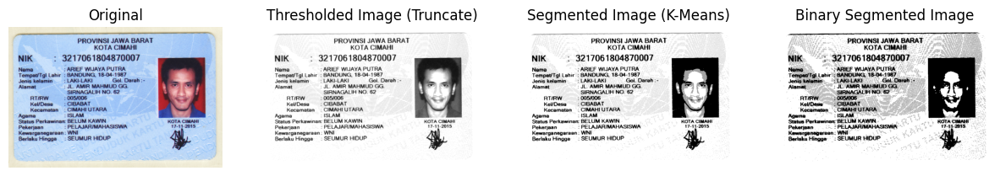


Teks terambil dari gambar ktp6.png:
 

NIK :

Nama

Tempat/Tg! Lahir

Jenis Kelamin

Alamat

. RTRW

KelDesa
Kecamatan

Agama

Status Perkawinan: KAWIN

Pekerjaan

Kewarganegaraan: WNI —

Berlaku Hingga

— PROVINSI JAWA BARAT
KABUPATEN BEKASI

381b0b181251000b6

: WIDIARSO

: PEMALANG, 18-12-1959

: LAKI-LAKI Gol Darah : 0
: SKU JL.SUMATRA BLOK B78/15
1063-0094 |
:MEKARSARI:.- —

: TAMBUN SELATAN

:ISLAM

  

. BEKASI
: KARYAWAN SWASTA 22-54 2013

118-12-2018 N



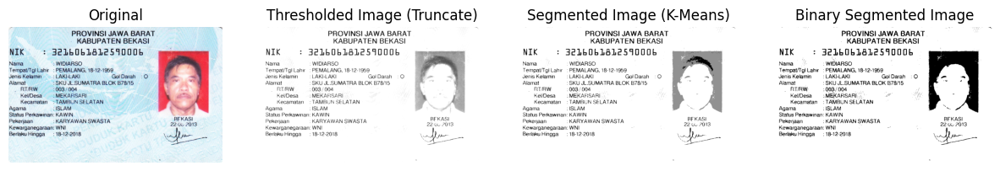


Teks terambil dari gambar ktp3.png:
PROVINSI JAWA TIMUR

KABUPATEN TUBAN
NIK 1 4503140404800003
Nama MAFTUCHIN
Tempat/Tgl Lahir TUBAN, 06-06-1980
Jenis Kelamin LAKILAKI Gol. Daran
Wamat JL MASJID AL FALAH
RAW 001 1 002

KolDesa — SUGIHARJO
Kecamatan TUBAN
ISLAM

 

Tusan
og
AN

|

Beraku Hingga 06 06 2017 1
—-

i

 



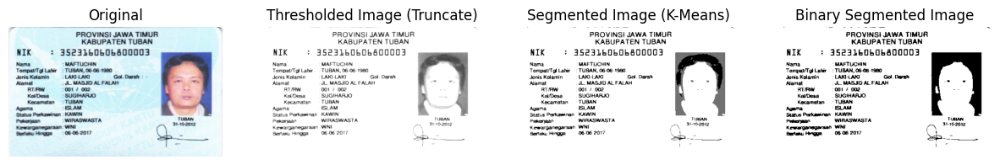


Teks terambil dari gambar ktp4.png:
PROVINSI JAWA TIMUR

KABUPATEN TUBAN
NIK 1 4503140404800003
Nama MAFTUCHIN
Tempat/Tgl Lahir TUBAN, 06-06-1980
Jenis Kelamin LAKILAKI Gol. Daran
Wamat JL MASJID AL FALAH
RAW 001 1 002

KolDesa — SUGIHARJO
Kecamatan TUBAN
ISLAM

 

Tusan
og
AN

|

Beraku Hingga 06 06 2017 1
—-

i

 



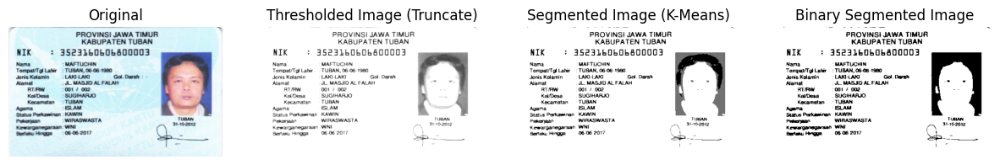


Teks terambil dari gambar ktp1.png:
PROVINSI BENGKULU
KOTA BENGKULU

NIK 2 19?710421014130002

Nama GALANG RAKA PRATAMA

Tempal/TgI Lahir : BENGKULU, 24-01-1993

Jenia Kelamin LAKI-LAKI Got. Darah - A

tamat : JLUNIB PERMA ILINO 35
PERUMNAS UNIB

RURW 1015 7 003
KeliDesa — : PEMATANG GUBERNUR
Kecamatan : MUARA BANGKAHULU

Agema ISLAM
'Statuy Perkawinan : BELUM KAWIN
Pekerjaan : PELAJAR/MAHASISWA

Kemargapegataan: WNI
Berlaku Hingga — :24-91-2017

 



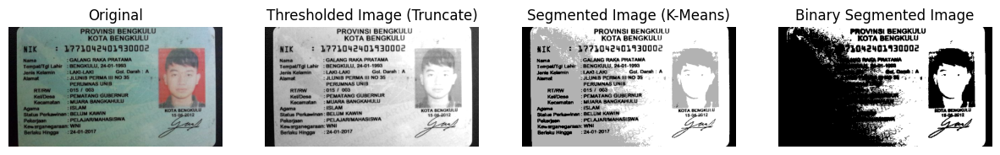


Teks terambil dari gambar KTP7.jpeg:
1 ABDURRAUF, S.Pd, M.Pd

ir: CELLENGENGE. 25-10-1972

2 LAKI-LAKI Goi. Darah :O
1 JL. MERDEKA NO.43

1 201/004

1 BLA
: LALABATA
2 ISLAM

: KAWIN
5 PEGAWAI NEGERI SIPIL (PNS)

PROVINSI SULAWESI! SELATAN
KABUPATEN SOPPENG

23120142510 720002

Sa SEUMUR HIDUP

   

SN ad:
SOPPENG
30-03-2021

AK



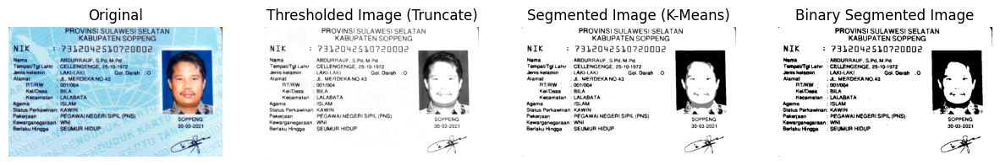

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pytesseract

# Path to the folder containing KTP images
folder_path = '/content/drive/MyDrive/PCVK/KTP/'

# Get a list of image files in the folder
ktp_files = [file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Define the number of clusters (colors) for K-Means
num_clusters = 3

# Threshold value for creating a binary image
threshold_value = 128

# Iterate through KTP images
for i, ktp_file in enumerate(ktp_files):
    ktp_path = os.path.join(folder_path, ktp_file)
    ktp_image = cv2.imread(ktp_path)

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(ktp_image, cv2.COLOR_BGR2GRAY)

    # Thresholding with "Truncate" method
    _, thresholded_image = cv2.threshold(gray_image, 170, 255, cv2.THRESH_TRUNC)

    # Segmentasi K-Means pada hasil threshold
    pixel_values = thresholded_image.reshape((-1, 1))
    pixel_values = np.float32(pixel_values)
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

    _, labels, centers = cv2.kmeans(pixel_values, num_clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    centers = np.uint8(centers)
    labels = labels.flatten()

    # Membuat gambar tersegmentasi dengan menggunakan pusat cluster
    segmented_image = centers[labels.flatten()].reshape(thresholded_image.shape)

    # Mengubah hasil segmentasi menjadi citra biner
    binary_image = cv2.threshold(segmented_image, threshold_value, 255, cv2.THRESH_BINARY)[1]

    # Menampilkan hasil
    plt.figure(figsize=(15, 10))

    plt.subplot(1, 4, 1)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(ktp_image, cv2.COLOR_BGR2RGB))
    # Thresholding with "Truncate" method)
    plt.title('Original')

    plt.subplot(1, 4, 2)
    plt.axis('off')
    plt.imshow(thresholded_image, cmap='gray')
    plt.title('Thresholded Image (Truncate)')

    plt.subplot(1, 4, 3)
    plt.axis('off')
    plt.imshow(segmented_image, cmap='gray')
    plt.title(f'Segmented Image (K-Means)')

    plt.subplot(1, 4, 4)
    plt.axis('off')
    plt.imshow(binary_image, cmap='gray')
    plt.title('Binary Segmented Image')

    # Lakukan OCR untuk mendapatkan teks dari citra biner
    text = pytesseract.image_to_string(segmented_image, lang="ind")
    print(f'\nTeks terambil dari gambar {ktp_file}:\n{text}')

    plt.show()
